В моем распоряжении данные сервиса аренды самокатов под названием GoFast. Данные содержат информацию о некоторых пользователях из разных городов, а также об их поездках. 
Моя цель провести анализ этих данных, проверить некоторые гипотезы, которые могут помочь бизнесу вырасти.
Насколько мне известо, можно пользоваться сервисом без подписки, оплачивая каждую поездку, или с ежемесячной подпиской, так будет каждая отдельная поездка дешевле. Значительная часть исследования посвящена изучению характеристик в контексте разделения на эти две категории.

**Задачи исследования**
1. Описать и визуализировать общую информацию о пользователях и поездках исходя из имеющейся информации о городах проживания пользователей, продолжительности поездок, возрасте и категории подписки.
2. Посчитать и проанализировать помесячную выручку полученную от пользователей с подпиской и без.
3. Проверить конкретные гипотезы полезные продакт-менеджерам о продолжительности, дальности поездок, в двух категорях пользователей с подпиской и без, с целью  выяснить какая категория более выгодна для компании. 
4. Провести оценки вероятностей конкретных событий интересующие отдел маркетинга.

**Описание данных**
Имеющиеся данные содержатся в трех файлах: информация о пользователях (users_go.csv), их поездках (rides_go.csv) и справочной информации о подписках (subscriptions_go.csv).

Поскольку ранее с этими данными работать не приходилось нужно будет произвести предобработку данных перед исследованием: посмотреть какие типы данных содержатся в столбцах, преобразовать при необходимости, определить есть ли пропуски в данных, и если есть то попытаться заменить их на что-то осмысленное. Также нужно посмотреть дубликаты, редкие или аномальные выбивающиеся значения.

#### Шаг 1. Загрузка данных

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import scipy.stats as stats
from IPython.display import display

In [2]:
data_users = pd.read_csv('/datasets/users_go.csv')

In [3]:
data_rides = pd.read_csv('/datasets/rides_go.csv')

In [4]:
data_subs = pd.read_csv('/datasets/subscriptions_go.csv')

Чтобы не обращаться к каждому набору данных по отдельности, создадим лист и будем обращаться к листу.

In [5]:
df_list = [data_rides, data_users, data_subs]

In [6]:
for i in df_list:
    display(i.head(10))
    print("\n")

,user_id,distance,duration,date
0,1,4409.919140,25.599769,2021-01-01
1,1,2617.592153,15.816871,2021-01-18
2,1,754.159807,6.232113,2021-04-20
3,1,2694.783254,18.511000,2021-08-11
4,1,4028.687306,26.265803,2021-08-28
5,1,2770.890808,16.650138,2021-10-09
6,1,3039.020292,14.927879,2021-10-19
7,1,2842.118050,23.117468,2021-11-06
8,1,3412.690668,15.238072,2021-11-14
9,1,748.690645,15.041884,2021-11-22


,user_id,name,age,city,subscription_type
0,1,Кира,22,Тюмень,ultra
1,2,Станислав,31,Омск,ultra
2,3,Алексей,20,Москва,ultra
3,4,Константин,26,Ростов-на-Дону,ultra
4,5,Адель,28,Омск,ultra
5,6,Регина,25,Краснодар,ultra
6,7,Игорь,23,Омск,ultra
7,8,Юрий,23,Краснодар,ultra
8,9,Ян,21,Пятигорск,ultra
9,10,Валерий,18,Екатеринбург,ultra


,subscription_type,minute_price,start_ride_price,subscription_fee
0,free,8,50,0
1,ultra,6,0,199


In [7]:
for i in df_list:
    i.info()
    print("\n")

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18068 entries, 0 to 18067
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   user_id   18068 non-null  int64  
 1   distance  18068 non-null  float64
 2   duration  18068 non-null  float64
 3   date      18068 non-null  object 
dtypes: float64(2), int64(1), object(1)
memory usage: 564.8+ KB


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1565 entries, 0 to 1564
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   user_id            1565 non-null   int64 
 1   name               1565 non-null   object
 2   age                1565 non-null   int64 
 3   city               1565 non-null   object
 4   subscription_type  1565 non-null   object
dtypes: int64(2), object(3)
memory usage: 61.3+ KB


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 4 columns):
 #  

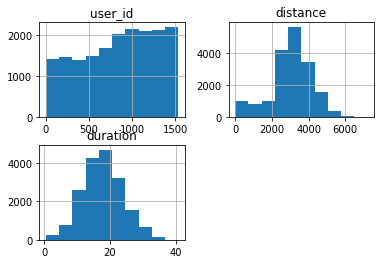

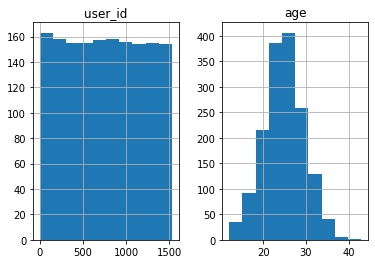

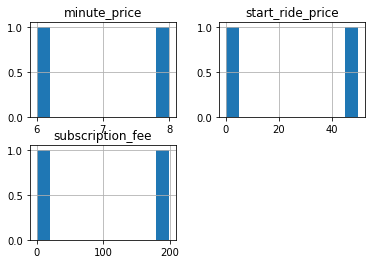

In [8]:
for i in df_list:
    print()
    i.hist()
    print('\n')

Данных в первой таблице users порядка 18 тыс строк, кажется пропусков нет. Во второй таблице ride 1500 строк и пропусков тоже нет. Из графиков видно, что 'distance', 'duration','age' подчиняются нормальному распределению, как и должно быть. Данные в последней таблице скорее справочная информация чем датасэт, в ней всего два типа значений для каждого столбца.

#### Шаг 2. Предобработка данных

In [9]:
# приведение столбца с датой к типу время
data_rides['date'] = pd.to_datetime(data_rides['date'])


In [10]:
# новый столбец с номером месяца на основе столбца date
data_rides['month'] = data_rides['date'].dt.month

In [11]:
min_date = data_rides['date'].min()
max_date = data_rides['date'].max()

# Вывод информации о периоде данных
print("Период данных с", min_date, "по ", max_date)

Период данных с 2021-01-01 00:00:00 по  2021-12-30 00:00:00


In [12]:
# проверка пустых значений в циле в списке с датасетами
for i in df_list:
    print(i.isnull().sum())
    print('\n')

user_id     0
distance    0
duration    0
date        0
month       0
dtype: int64


user_id              0
name                 0
age                  0
city                 0
subscription_type    0
dtype: int64


subscription_type    0
minute_price         0
start_ride_price     0
subscription_fee     0
dtype: int64




Пустых значений нет, это радует

In [13]:
# подсчет явных дубликатов
for i in df_list:
    print(i.apply(lambda x: x.duplicated().sum()))
    print('\n')

user_id     16534
distance        0
duration       94
date        17704
month       18056
dtype: int64


user_id                31
name                 1371
age                  1536
city                 1557
subscription_type    1563
dtype: int64


subscription_type    0
minute_price         0
start_ride_price     0
subscription_fee     0
dtype: int64




Присутствуют явные дубликаты в тех столбцах где это нормально, например user_id, потому что один пользователь может несколько раз пользоваться сервисом, так же как и в именах, возрасте, и тем более городе

In [14]:
# создаем список дубликатов
duplicates = data_users[data_users.duplicated(subset='user_id', keep=False)]

# дополняем дубликаты оригиналами, чтобы было понятно 
# отличаются ли чем то другим от дубликатов кроме id
duplicates_and_originals = data_users[data_users['user_id'].isin(duplicates['user_id'])]

# настройки для вывода всех строк и колонок
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None) 
print(duplicates_and_originals.sort_values(by='user_id'))

      user_id        name  age            city subscription_type
15         16      Амалия   27       Краснодар             ultra
1535       16      Амалия   27       Краснодар             ultra
42         43    Стефания   22            Омск             ultra
1539       43    Стефания   22            Омск             ultra
1563       47        Юрий   28          Тюмень             ultra
46         47        Юрий   28          Тюмень             ultra
1555       72      Никита   25          Москва             ultra
71         72      Никита   25          Москва             ultra
1549      108       Влада   29          Тюмень             ultra
107       108       Влада   29          Тюмень             ultra
1553      121       Алина   25       Пятигорск             ultra
120       121       Алина   25       Пятигорск             ultra
126       127       Павел   25       Пятигорск             ultra
1540      127       Павел   25       Пятигорск             ultra
135       136     Марсель

Дубликаты по идентификатору полные дубликаты строк оригиналов, от них можно избавиться

In [15]:
data_users = data_users.drop_duplicates(subset='user_id', keep='first')

In [16]:
data_users.apply(lambda x: x.duplicated().sum())

user_id                 0
name                 1340
age                  1505
city                 1526
subscription_type    1532
dtype: int64

#### Шаг 3. Исследовательский анализ данных

##### Оценка частоты встречаемости городов

In [17]:
print(data_users['city'].unique())

['Тюмень' 'Омск' 'Москва' 'Ростов-на-Дону' 'Краснодар' 'Пятигорск'
 'Екатеринбург' 'Сочи']


Всего 8 городов в данных, можно построть круговую диаграмму, чтобы понять соотношение частоты встречаемости каждого города

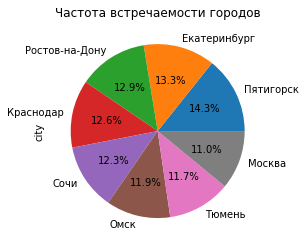

In [18]:
city_counts = data_users['city'].value_counts()

# Круговая диаграмма
city_counts.plot(kind='pie', autopct='%1.1f%%')
plt.title('Частота встречаемости городов')
plt.show()

В данных очень близкое рапределение городов, разница в пределах нескольких процентов

##### Cоотношение пользователей с подпиской и без подписки

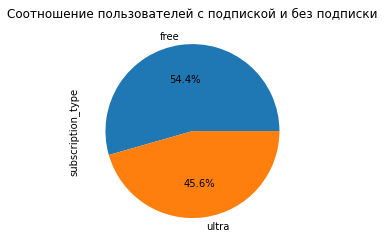

In [19]:
subscription_counts = data_users['subscription_type'].value_counts()

# Круговая диаграмма
subscription_counts.plot(kind = 'pie',autopct = '%1.1f%%')
plt.title('Соотношение пользователей с подпиской и без подписки')
plt.show()

Количство пользователей с подпиской чуть меньше чем тех, кто катается без подписки. Хотя соотношение бликое к 50 на 50

In [20]:
# Посчитаем количество пользователей с подпиской
count_subscription = data_users['subscription_type'].value_counts()['ultra']

# Посчитаем количество пользователей без подписки:
count_no_subscription = data_users['subscription_type'].value_counts()['free']

difference = count_no_subscription - count_subscription

# Рассчитаем процентное отношение разницы к размеру второй выборки:
percentage_difference = (difference / count_subscription) * 100
print(count_subscription, count_no_subscription)
print(percentage_difference)

699 835
19.45636623748212


##### Оценка возраста пользователей;

12
43


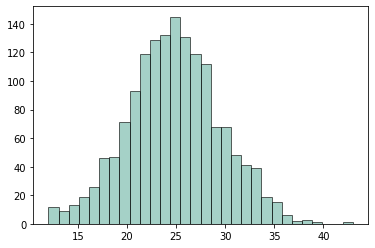

In [21]:
age_data = data_users['age']

# найдем минимум и максимум 
print(age_data.min())
print(age_data.max())

# создание гистограммы
plt.hist(
    age_data, bins = 30, edgecolor="black", 
    color="#69b3a2", alpha=0.6
)

plt.show()

Разброс от 12 до 43 лет, срадний возраст около 25, нормальное унимодальное распределение

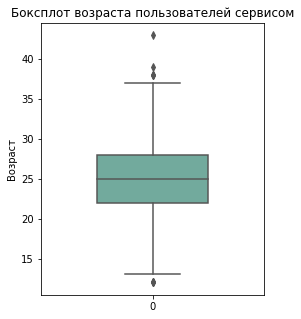

In [22]:
plt.figure(figsize=(4, 5))
ax = sns.boxplot(data = age_data, color="#69b3a2", width=0.5)

plt.ylabel('Возраст')
plt.title('Боксплот возраста пользователей сервисом')

plt.show()

Возраст пользователй резко падает после 35, а пользователи после 37 вообще скорее исключение

##### Оценка расстояния, которое пользователь преодолел за одну поездку;

In [23]:
distance_data = data_rides['distance']
print(distance_data.describe())

count    18068.000000
mean      3070.659976
std       1116.831209
min          0.855683
25%       2543.226360
50%       3133.609994
75%       3776.222735
max       7211.007745
Name: distance, dtype: float64


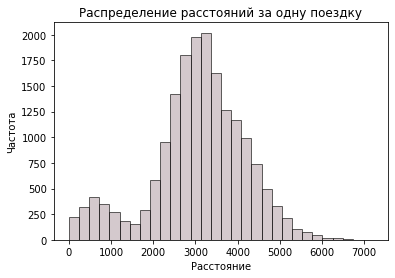

In [24]:
plt.hist(
    distance_data, bins = 30, color = '#b8a5ac',
    edgecolor = 'black', alpha = 0.6
)
plt.xlabel('Расстояние')
plt.ylabel('Частота')
plt.title('Распределение расстояний за одну поездку')
plt.show()

Среднее расстояние, которое пользователь преодолевает за одну поездку, составляет около 3 километров. Распределение расстояний имеет два пика (бимодальное распределение), причем второй малый пик находится примерно около 500 метров. Никто из пользователей не преодолел расстояние более 7.2 километров на арендованном самокате.

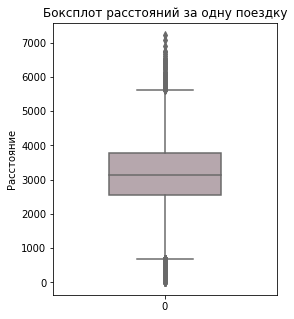

In [25]:
plt.figure(figsize=(4, 5))
ax = sns.boxplot(data = distance_data, color='#b8a5ac', width=0.5)

plt.ylabel('Расстояние')
plt.title('Боксплот расстояний за одну поездку')

plt.show()

##### Оценка продолжительности поездок;

In [26]:
duration_data = data_rides['duration']
print(duration_data.describe())

count    18068.000000
mean        17.805011
std          6.091051
min          0.500000
25%         13.597563
50%         17.678395
75%         21.724800
max         40.823963
Name: duration, dtype: float64


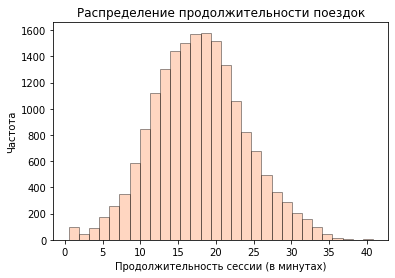

In [27]:
plt.hist(
    duration_data, bins = 30,
    color = '#ff9966', edgecolor = 'black', alpha = 0.4)

plt.xlabel('Продолжительность сессии (в минутах)')
plt.ylabel('Частота')
plt.title('Распределение продолжительности поездок')
plt.show()

Распределение продолжительности поездок нормальное унимодальное, от полминуты до 40 минут, средняя продолжительность поездки около 20 минут

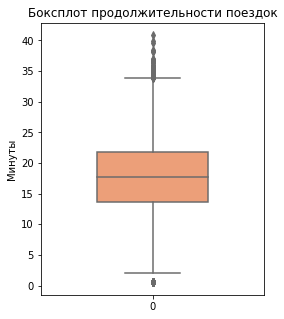

In [28]:
plt.figure(figsize=(4, 5))
ax = sns.boxplot(data = duration_data, color='#ff9966', width=0.5)

plt.ylabel('Минуты')
plt.title('Боксплот продолжительности поездок')

plt.show()

#### Шаг 4. Объединение данных

##### Объединение данных о пользователях, поездках и подписках в один датафрейм;

Чтобы объединить данные о пользователях, поездках и подписках в один датафрейм воспользуйтемся методом merge()

In [29]:
# Размеры исходных датасетов
print('Размер датасета data_rides:', data_rides.shape)
print('Размер датасета data_users:', data_users.shape)


Размер датасета data_rides: (18068, 5)
Размер датасета data_users: (1534, 5)


In [30]:
# Дополнение данных о поездках информацией о пользователях
data_rides = data_rides.merge(data_users, on='user_id', how='left')
display(data_rides.head(10))

,user_id,distance,duration,date,month,name,age,city,subscription_type
0,1,4409.919140,25.599769,2021-01-01,1,Кира,22,Тюмень,ultra
1,1,2617.592153,15.816871,2021-01-18,1,Кира,22,Тюмень,ultra
2,1,754.159807,6.232113,2021-04-20,4,Кира,22,Тюмень,ultra
3,1,2694.783254,18.511000,2021-08-11,8,Кира,22,Тюмень,ultra
4,1,4028.687306,26.265803,2021-08-28,8,Кира,22,Тюмень,ultra
5,1,2770.890808,16.650138,2021-10-09,10,Кира,22,Тюмень,ultra
6,1,3039.020292,14.927879,2021-10-19,10,Кира,22,Тюмень,ultra
7,1,2842.118050,23.117468,2021-11-06,11,Кира,22,Тюмень,ultra
8,1,3412.690668,15.238072,2021-11-14,11,Кира,22,Тюмень,ultra
9,1,748.690645,15.041884,2021-11-22,11,Кира,22,Тюмень,ultra


In [31]:
print('Размер промежуточного датасета:', data_rides.shape)

Размер промежуточного датасета: (18068, 9)


In [32]:
# Дополнение информацией об условиях подписки
data_rides = data_rides.merge(data_subs, on='subscription_type', how='left')
display(data_rides.head(10))

,user_id,distance,duration,date,month,name,age,city,subscription_type,minute_price,start_ride_price,subscription_fee
0,1,4409.919140,25.599769,2021-01-01,1,Кира,22,Тюмень,ultra,6,0,199
1,1,2617.592153,15.816871,2021-01-18,1,Кира,22,Тюмень,ultra,6,0,199
2,1,754.159807,6.232113,2021-04-20,4,Кира,22,Тюмень,ultra,6,0,199
3,1,2694.783254,18.511000,2021-08-11,8,Кира,22,Тюмень,ultra,6,0,199
4,1,4028.687306,26.265803,2021-08-28,8,Кира,22,Тюмень,ultra,6,0,199
5,1,2770.890808,16.650138,2021-10-09,10,Кира,22,Тюмень,ultra,6,0,199
6,1,3039.020292,14.927879,2021-10-19,10,Кира,22,Тюмень,ultra,6,0,199
7,1,2842.118050,23.117468,2021-11-06,11,Кира,22,Тюмень,ultra,6,0,199
8,1,3412.690668,15.238072,2021-11-14,11,Кира,22,Тюмень,ultra,6,0,199
9,1,748.690645,15.041884,2021-11-22,11,Кира,22,Тюмень,ultra,6,0,199


In [33]:
print('Размер результирующего датасета:', data_rides.shape)

Размер результирующего датасета: (18068, 12)


In [34]:
# проверим что нет несостыковок
print(data_rides.isnull().sum())

user_id              0
distance             0
duration             0
date                 0
month                0
name                 0
age                  0
city                 0
subscription_type    0
minute_price         0
start_ride_price     0
subscription_fee     0
dtype: int64


##### Создание раздельных датафреймов c данными о пользователях  с подпиской и без;

In [35]:
# создаем две таблицы из одной старой
users_without_subs = data_rides[data_rides['subscription_type'] == 'free']
users_with_subs = data_rides[data_rides['subscription_type'] == 'ultra']

In [36]:
# проверим что ничего не пропало
print(len(users_without_subs)+len(users_with_subs))
print(len(data_rides))

18068
18068


##### Анализ информации о расстоянии и времени поездок для пользователей обеих категорий;

Визуализируем данные с помощью ящика с усами и посмотрим на основные метрики

In [37]:
print(users_without_subs[['duration', 'distance']].describe())
print(users_with_subs[['duration', 'distance']].describe())

           duration      distance
count  11568.000000  11568.000000
mean      17.390909   3045.495282
std        6.326803   1246.173806
min        0.500000      0.855683
25%       12.958437   2366.562689
50%       17.326890   3114.648465
75%       21.594071   3905.697894
max       34.948498   7211.007745
          duration     distance
count  6500.000000  6500.000000
mean     18.541985  3115.445388
std       5.572048   836.895330
min       3.760353   244.210438
25%      14.524654  2785.444017
50%      18.178153  3148.637229
75%      21.884129  3560.574425
max      40.823963  5699.769662


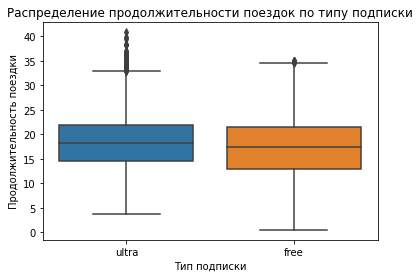

In [38]:
sns.boxplot(x='subscription_type', y='duration', data=data_rides)
plt.xlabel('Тип подписки')
plt.ylabel('Продолжительность поездки')
plt.title('Распределение продолжительности поездок по типу подписки')
plt.show()

In [39]:
mean_difference = (users_with_subs['duration'].mean()
                   -users_without_subs['duration'].mean())
print(mean_difference)

1.1510758641418413


По графикам можно сделать вывод, что у пользователей без подписки средняя продолжительность поездок короче (на одну минуту 9 секунд) по сравнению с пользователями с подпиской. Также у пользователей с подпиской наблюдается небольшое количество выбросов с более длительными поездками (после примерно половины часа).

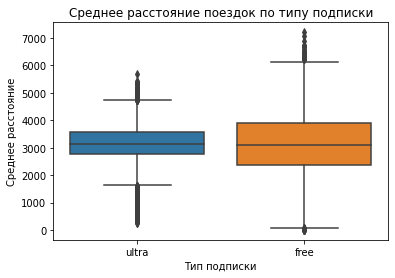

In [40]:
sns.boxplot(x='subscription_type', y='distance', data=data_rides)
plt.xlabel('Тип подписки')
plt.ylabel('Среднее расстояние')
plt.title('Среднее расстояние поездок по типу подписки')
plt.show()

У пользователей без подписки наблюдается немного больший размах и больше выбросов в значениях. В то же время, у пользователей с подпиской преодолеваемые дистанции более стабильны и предсказуемы. Выборка пользователей с подпиской сильнее сконцентрированна вокруг среднего. Попробуем еще график.

In [41]:
durations_without_subs = users_without_subs['duration']
durations_with_subs = users_with_subs['duration']

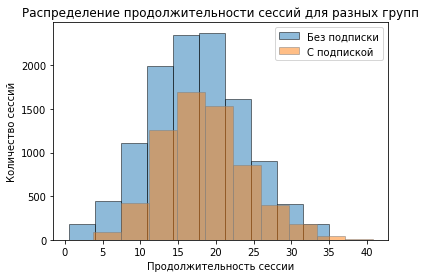

In [42]:
# Построение гистограммы распределения значений
# для пользователей без подписки
plt.hist(
    durations_without_subs, bins=10,
    edgecolor = 'black', alpha=0.5, label='Без подписки'
)

# Построение гистограммы распределения значений 
# для пользователей с подпиской
plt.hist(
    durations_with_subs, bins=10,
    edgecolor = 'grey', alpha=0.5, label='С подпиской')

plt.xlabel('Продолжительность сессии')
plt.ylabel('Количество сессий')
plt.title('Распределение продолжительности сессий для разных групп')

plt.legend()
plt.show()

Этот график чуть более наглядно демонстирует, что средняя продолжительность сессий у обоих категорий почти одинакова, однако у пользователей без подписки чуть больше разброс.

#### Шаг 5. Подсчёт выручки

##### Cуммарное расстояние, количество поездок и суммарное время для каждого пользователя за каждый месяц;

In [43]:
summary_df = data_rides.groupby(['user_id', 'month']).agg(
    distance_sum=('distance', 'sum'),
    number_of_trips=('user_id', 'count'),
    duration_sum=('duration', 'sum')
).reset_index()

display(summary_df)


,user_id,month,distance_sum,number_of_trips,duration_sum
0,1,1,7027.511294,2,41.416640
1,1,4,754.159807,1,6.232113
2,1,8,6723.470560,2,44.776802
3,1,10,5809.911100,2,31.578017
4,1,11,7003.499363,3,53.397424
5,1,12,6751.629942,2,27.203912
6,2,3,10187.723006,3,60.959959
7,2,4,6164.381824,2,39.048633
8,2,6,3255.338202,1,13.851127
9,2,7,6780.722964,2,46.170157


In [44]:
# проверяю есть ли в каком-то столбце пропуски
null_values = summary_df.isnull().any()
print(null_values)

user_id            False
month              False
distance_sum       False
number_of_trips    False
duration_sum       False
dtype: bool


##### Помесячная выручка, которую принёс каждый пользователь;

In [45]:
# Округляем продолжительность поездки до следующего целого числа 
# и записываем в новый столбец
summary_df['rounded_duration'] = np.ceil(summary_df['duration_sum'])

In [46]:
# Добавим новый столбец с типом подписки
summary_df = (
    summary_df.merge(data_users[['user_id', 'subscription_type']],
                               on='user_id', how='left')
             )


In [47]:
display(summary_df)

,user_id,month,distance_sum,number_of_trips,duration_sum,rounded_duration,subscription_type
0,1,1,7027.511294,2,41.416640,42.0,ultra
1,1,4,754.159807,1,6.232113,7.0,ultra
2,1,8,6723.470560,2,44.776802,45.0,ultra
3,1,10,5809.911100,2,31.578017,32.0,ultra
4,1,11,7003.499363,3,53.397424,54.0,ultra
5,1,12,6751.629942,2,27.203912,28.0,ultra
6,2,3,10187.723006,3,60.959959,61.0,ultra
7,2,4,6164.381824,2,39.048633,40.0,ultra
8,2,6,3255.338202,1,13.851127,14.0,ultra
9,2,7,6780.722964,2,46.170157,47.0,ultra


In [48]:
# Функция которая осуществляет рассчет в зависимости от типа подписки
def calculate_cost(row):
    if row['subscription_type'] == 'free':
        return row['number_of_trips'] * 50 + (8 * row['rounded_duration'])
    elif row['subscription_type'] == 'ultra':
        return (6 * row['rounded_duration']) + 199
    else:
        return None

# Применяем функцию calculate_cost для создания нового столбца "cost" 
# в "summary_df"
summary_df['month_cost'] = summary_df.apply(calculate_cost, axis=1)

# Выведите обновленный DataFrame "summary_df" с новым столбцом "cost"
display(summary_df)

,user_id,month,distance_sum,number_of_trips,duration_sum,rounded_duration,subscription_type,month_cost
0,1,1,7027.511294,2,41.416640,42.0,ultra,451.0
1,1,4,754.159807,1,6.232113,7.0,ultra,241.0
2,1,8,6723.470560,2,44.776802,45.0,ultra,469.0
3,1,10,5809.911100,2,31.578017,32.0,ultra,391.0
4,1,11,7003.499363,3,53.397424,54.0,ultra,523.0
5,1,12,6751.629942,2,27.203912,28.0,ultra,367.0
6,2,3,10187.723006,3,60.959959,61.0,ultra,565.0
7,2,4,6164.381824,2,39.048633,40.0,ultra,439.0
8,2,6,3255.338202,1,13.851127,14.0,ultra,283.0
9,2,7,6780.722964,2,46.170157,47.0,ultra,481.0


Рассчитанные данные о выручке пригодятся дальше при проверке гипотез.

#### Шаг 6. Проверка гипотез

##### Тратят ли пользователи с подпиской больше времени на поездки?

Нулевая гипотеза (H0) будет звучать следующим образом:
"Средняя продолжительность сессий пользователей с подпиской равна средней продолжительности сессий пользователей без подписки."

H1
"Средняя продолжительность сессий пользователей с подпиской отличается от средней продолжительности сессий пользователей без подписки в большую сторону."

В Python есть специальный метод для проверки гипотезы о равенстве среднего двух генеральных совокупностей по взятым из них выборкам: scipy.stats.ttest_ind(array1, array2, equal_var, alternative).

In [49]:
durations_without_subs = users_without_subs['duration']
durations_with_subs = users_with_subs['duration']

In [50]:
alpha = 0.05
results = stats.ttest_ind(durations_with_subs,
                          durations_without_subs,
                          alternative='greater')


print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу') 

p-значение: 1.2804098316645618e-34
Отвергаем нулевую гипотезу


Поняла ошибку, переправила в коде и вывод заодно 👌

 В разделе 4.3 мы видели на графиках, что среднее (mean) для пользователей с подпиской и без почти одинаковое. Однако, тест Стюдента, показывает, что поездки пользователей с подпиской по продолжительности чуть дольше. Значение p_value больше выбранного уровня значимости (0.05), мы можем сделать вывод об  статистически значимых различиях в продолжительности сессий. Так, например, мы видим разницу в среднем (mean) в одну минуту 9 секунд, что может показаться не значительным с практической точки зрения, однако, в сумме большого количества поездок будет набегать ощутимая прибыль. 

##### Можно ли сказать, что расстояние, которое проезжают пользователи с подпиской за одну поездку, не превышает 3130 метров? 

Пусть H0 - нулевая гипотеза, которая гласит, что среднее расстояние поездок пользователей с подпиской равно или иеньше 3130 метров.
Альтернативная гипотеза H1 - среднее расстояние поездок пользователей с подпиской превышает 3130 метров.

Для проведения одностороннего теста нужно использовать метод scipy.stats.ttest_1samp().В качестве аргументов указываем alternative='greater' для правосторонней альтернативной гипотезы

In [51]:
distance_with_subs = users_with_subs['distance']

In [52]:
optimal_distance = 3130

alpha = 0.05

results = stats.ttest_1samp(
    distance_with_subs, 
    optimal_distance, 
    alternative='greater' 
)

print('p-значение:', results.pvalue)

if (results.pvalue < alpha):
    print('Отвергаем нулевую гипотезу')
else:
    print('Не отвергаем нулевую гипотезу') 

p-значение: 0.9195368847849785
Не отвергаем нулевую гипотезу


Полученное p-значение равно 0.92 и мы не отвергаем нулевую гипотезу, это означает, что у нас нет достаточных доказательств для того, что среднее расстояние поездок пользователей с подпиской превышает 3130 метров. Пользователи с подпиской не преодолеают оптимальное расстояние износа самоката.

In [53]:
print(distance_with_subs.mean())

3115.4453880370247


Средее (mean) и правда чуть меньше опитимального расстояния, все логично

##### Будет ли помесячная выручка от пользователей с подпиской по месяцам выше чем у пользователей без подписки?

In [54]:
month_cost_free = (
    summary_df.loc[summary_df['subscription_type'] == 'free', 'month_cost']
)
month_cost_ultra = (
    summary_df.loc[summary_df['subscription_type'] == 'ultra', 'month_cost']
)

In [55]:
month_cost_free

4533      170.0
4534      938.0
4535      202.0
4536      178.0
4537      332.0
4538      268.0
4539      186.0
4540      444.0
4541      406.0
4542      194.0
4543      316.0
4544      186.0
4545      162.0
4546      170.0
4547      308.0
4548      720.0
4549      244.0
4550      356.0
4551      444.0
4552      276.0
4553      178.0
4554      210.0
4555      114.0
4556      654.0
4557      242.0
4558      130.0
4559      170.0
4560      226.0
4561      622.0
4562      242.0
4563      252.0
4564      130.0
4565      348.0
4566      258.0
4567      194.0
4568      138.0
4569      226.0
4570      574.0
4571      984.0
4572      138.0
4573      122.0
4574       58.0
4575      534.0
4576      114.0
4577      226.0
4578      322.0
4579     1058.0
4580      470.0
4581      364.0
4582      130.0
4583      396.0
4584      170.0
4585      516.0
4586      550.0
4587      444.0
4588      138.0
4589      316.0
4590      444.0
4591      484.0
4592      518.0
4593      210.0
4594      364.0
4595    

Пусть нулевая гипотеза будет такакя: что средняя помесячная выручка от пользователей с подпиской равна или меньше средней помесячной выручки от пользователей без подписки.
Альтернативная гипотеза H1 - помесячная выручка от пользователей с подпиской выше, чем выручка от пользователей без подписки.

In [56]:
alpha = 0.05

results = stats.ttest_ind(
    month_cost_ultra, 
    month_cost_free, 
    alternative='greater')


print('p-значение:', results.pvalue)

if results.pvalue < alpha:
    print('Отвергаем нулевую гипотезу')
else:
    print('Не получилось отвергнуть нулевую гипотезу') 

p-значение: 2.8130926188487286e-35
Отвергаем нулевую гипотезу


Результат теста Стьюдента говорит нам о том, что нужно принять альтернативную гипотезу, и помесячная выручка от пользователей с подпиской выше, чем выручка от пользователей без подписки. Попробуем визуализировать. 

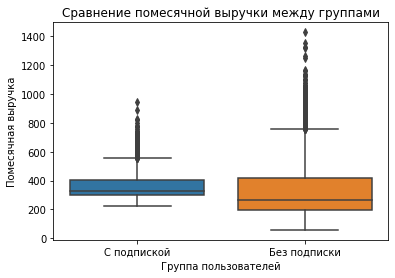

In [57]:
# Средняя помесячная выручка для каждой группы
# пришлось собрать данные в датафрейм, 
# потому что график принимает на вход такой формат
df = pd.DataFrame(
    {'С подпиской': month_cost_ultra, 'Без подписки': month_cost_free}
)

# Создание boxplot
sns.boxplot(data=df)
plt.xlabel('Группа пользователей')
plt.ylabel('Помесячная выручка')
plt.title('Сравнение помесячной выручки между группами')
plt.show()

In [58]:
print(month_cost_ultra.mean())
print(month_cost_free.mean())

361.48180013236265
325.84289496910856


Ящик с усами и подсчет среднего также говорят о том, что выручка от людей с подпиской выше, примерно на 92 рубля в месяц.

##### Как изменилось количество обращений в техподдержку после обновления сервера? 

Если мы анализируем одну генеральную совокупность, с которой произошли некоторые изменения, мы будем проверять, равны ли средние совокупности до и после этого изменения. Тогда нулевая гипотеза будет звучать как: средние значения до и после изменения равны, а альтернативная в свою очередь будет о том, средние значения до и после изменени не равны. Поможет следующий код.

```python
results = st.ttest_rel(number_of_calls_before_update,
                       number_of_calls_after_update)

```

Далее в зависимоти от уровеня статистической значимости(обычно 5% или меньше) и от того будет ли посчитанный p-value превышать выбранный уровень значимости, мы сможем иметь основание отвергнуть нулевую гипотезу. Если p-value будет ниже уровня статистической значимости, мы примем альтернативную гипотезу, и будем считать, что количество обращений изменилось.

#### Шаг 7. Распределения

##### Какое минимальное количество промокодов нужно разослать, чтобы вероятность не выполнить план была примерно 5%

Биномиальное распределение описвается двумя параметрами p  и n,  где  p - вероятность события, в нашем случае это 10% или 1/10 пользователей продлевающих подписки, а n  - количество экспериментов, а в нашем случае это количество промокодов которые нужно разослать.  Вероятность не выполнить план которая нас устроит примерно 5%. Задача состоит в том, чтобы найти это n. Нам нужно чтобы количество успешных событий было равно 100. 

Самые простые вычисления нам говорят, что минимум 1000 промокодов нужно разослать чтобы получить 100. Наченем построения графиков с n = 1000

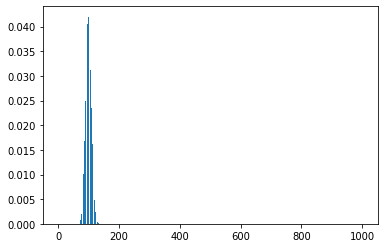

In [59]:
from math import factorial
p = 1/10
n = 1000

distr = []


for k in range(0, n + 1):
    choose = factorial(n) / (factorial(k) * factorial(n - k))
    prob = choose * p**k * (1-p)**(n-k)
    distr.append(prob)
plt.bar(range(0, n + 1), distr)
plt.show()

Попробуем взять n = 1500

/tmp/ipykernel_186/1459336372.py:13: RuntimeWarning: invalid value encountered in double_scalars
  prob = choose * p**k * (1-p)**(n-k)


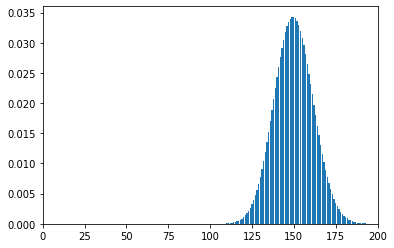

In [60]:
from matplotlib import pyplot as plt
# Использование встроенной функции comb для вычисления числа сочетаний, 
# иначе будет ошибка integer division result too large for a float
from scipy.special import comb

p = 1/10
n = 1500

distr = []

for k in range(0, n + 1):
    choose = comb(n, k)  
    prob = choose * p**k * (1-p)**(n-k)
    distr.append(prob)
    
plt.bar(range(0, n + 1), distr)
plt.xlim(0, 200)
plt.show()

Попробуем точно узнать вероятность 100 подписок при рассылке 1500 промокодов. Для  биномиального распределения можно найти близкую к нему аппроксимацию нормальным распределением. В этом нам поможет метод cdf()

In [61]:
from math import sqrt
from scipy import stats as st

# задаём параметры биномиального распределения
n = 1500
p = 0.1

# задаём параметры нормального распределения равными
# мат.ожиданию и дисперсии биномиального распределения
mu = n * p
sigma = sqrt(n * p * (1 - p))

# задаём нормальное распределение
distr = st.norm(mu, sigma) 

# считаем вероятность хвоста слева от 100
result = distr.cdf(100)
print(result)

8.413074170946365e-06


Если мы разошлем 1500 промокодов мы получим 100 подписок с вероятностью больше 99,999%. Но это лишнее. Нам достаточно вероятности выполнить план в 95%, или вероястность cdf = 0.05. Напишем функцию которая посчитает минимальное n при котором cdf меньше или равно 0.05

In [62]:
from math import sqrt
from scipy import stats as st

def calculate_cdf():
    p = 0.1  # Вероятность события
    
    for n in range(1000, 1500):
        # задаём параметры нормального распределения равными
        # мат.ожиданию и дисперсии биномиального распределения
        mu = n * p
        sigma = sqrt(n * p * (1 - p))
        
        # задаём нормальное распределение
        distr = st.norm(mu, sigma)
        
        # считаем вероятность хвоста слева от 100
        result = distr.cdf(100)
        
        # Проверяем, останавливаем когда вероятность меньше 0.05
        if result < 0.05:
            print("n:", n, "cdf:", result)
            break

calculate_cdf()


n: 1169 cdf: 0.04971489312694162


Итог: нам достаточно 1169 разосланных кодов чтобы получить 100 подписок, с вероятностью 95%, при условии что подпишется каждый десятый. Взглянем на график распределния для убедительности

/tmp/ipykernel_186/3467985643.py:8: RuntimeWarning: invalid value encountered in double_scalars
  prob = choose * p**k * (1-p)**(n-k)


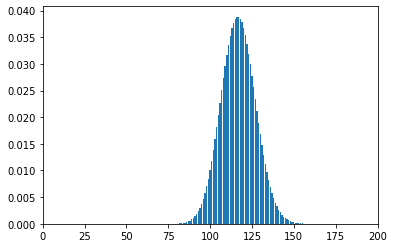

In [63]:
p = 1/10
n = 1169

distr = []

for k in range(0, n + 1):
    choose = comb(n, k)  
    prob = choose * p**k * (1-p)**(n-k)
    distr.append(prob)
    
plt.bar(range(0, n + 1), distr)
plt.xlim(0, 200)
plt.show()

##### Какая вероятность того, что уведомление откроют не более 399,5 тыс. пользователей?

Эта ситуация тоже описывается биномиальным распределением. Отдел маркетинга в задаче отправляет 1 млн уведомлений, тоесть n = 1 млн экспериментов. Вероятность открыть уведомление: p = 0.4. Нужно выяснить вероятность того, что уведомление откроют не более 399,5 тыс. пользователей. Мы можем воспользоваться нормальной аппроксимацией биномиального распределения и cdf() для точной оценки вероятности.

In [64]:
n = 1000000 # Отдел планирует разослать 1 млн уведомлений. 
p = 0.4 # биномиального распределения

mu = n * p # рассчитайте параметры 
sigma = sqrt(n * p * (1 - p)) # нормального распределения

distr = st.norm(mu, sigma) # задайте нормальное распределение

result = distr.cdf(399500) # найдите вероятность
print(result)

0.15371708296369768


Итого: Вероятность того, что уведомление откроют не более 399,5 тыс. пользователей составляет 15 процентов. Попытки построить график по ранее использованному шаблону с барплотом не увенчались успехом, построение занимает слишком много времени из-за большого числа экспериментов. Можем построить только апроксимацию нормального распределения.

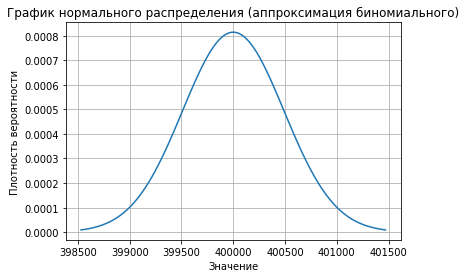

In [65]:
import numpy as np
from scipy.stats import norm

p = 0.4  # Вероятность события
n = 1000000  # Количество экспериментов

mu = n * p  # Среднее значение
sigma = np.sqrt(n * p * (1 - p))  # Стандартное отклонение

x = np.linspace(mu - 3 * sigma, mu + 3 * sigma, 100)  # Значения оси x
# np.linspace() создает 100 равномерно распределенных значений оси x 
# в пределах этого интервала.
y = norm.pdf(x, mu, sigma)  # Значения плотности вероятности

plt.plot(x, y)
plt.xlabel('Значение')
plt.ylabel('Плотность вероятности')
plt.title('График нормального распределения (аппроксимация биномиального)')
plt.grid(True)
plt.show()

Вывод: 
В данных наблюдается близкое распределение городов и почти равное количество пользователей с подпиской и без нее. Среднее расстояние поездок составляет около 3 километров, при этом есть два пика: один около 3 км и второй около 500 м. Средняя продолжительность поездок составляет около 20 минут, а средний возраст пользователей около 25 лет.

При проверке гипотез мы выяснили, что поездки пользователей с подпиской обычно чуть длиннее и имеют больший разброс продолжительности по сравнению с пользователями без подписки. Одновременно с этим, среднее расстояние поездок пользователей с подпиской не  превышает оптимальное расстояние износа самоката.Так же нам удалось выяснить, что  выручка от людей с подпиской выше, примерно на 92 рубля в месяц.

# Итоговый вывод

Итоги данного исследования успешно подведены в соответствии с поставленными задачами: 

1. Мы провели анализ данных о пользователях и поездках, оказалось в данных очень близкое рапределение городов, разница в пределах нескольких процентов. 
Пользователи сервиса в основном молодые люди 25 лет. Как пользователи в основном за одну поездку проезжают около 3 км. Интересно, что самое дальнее расстояние, которое преодолел пользователь на арендованном самокате составляет 7.2 км. Средняя поездка составляет около 20 минут, и в редких случаях превышает 35 минут. Пользователей без подписки чуть больше, но разница небольшая, всего в 19.5%, значит у сервиса есть неплохая клиентская база.

Обращает на себя внимание, что после 35 лет резко падает количество пользователей. Сомневаюсь, что ограничения могут быть связаны со здоровьем (слишком рано), или финансовой составляющей (скорее наоборот, 35 лет возраст максимально стабильного благосостояния). Поскольку возраст старше 35 это возраст когда люди часто имеют детей подростков, я бы предложила провести специальные акции для парных или семейных поездок родителей с детьми.  Такой подход поможет привлечь пользователей из возрастных категорий, которые до сих пор мало представлены в нашей клиентской базе.


2. Помесячная выручка: Мы рассчитали и проанализировали помесячную выручку от пользователей с подпиской и без подписки. Несмотря на то, что вклад каждой категории пользователей в общую выручку компании схож, выручка от людей с подпиской чуть выше. 

Поскольку выручка от клиентов с подпиской чуть выше, я бы рекомендовала проводить мероприятия направленные на удержание клиентов с подпиской. Можно предложить им дополнительные привилегии чтобы стимулировать их оставаться активными и продолжать пользоваться ежемесячной подпиской.

3. Мы провели проверку конкретных гипотез, связанных с продолжительностью и дальностью поездок у пользователей в двух категориях, интересных продакт-менеджерам сервиса. Расстояние, которое преодолевают обе группы во время поездки, оказалось почти одинаковым и не превышает оптимальное значение для износа самоката. Также нам удалось доказать, что поездки пользователей с подпиской по продолжительности чуть дольше, а именно разница в одну минуту 9 секунд, что может показаться не значительным с практической точки зрения, однако, в сумме большого количества поездок будет набегать ощутимая прибыль. Возможно, я бы предложила компании попытаться увеличить продолжительность поездок, может быть предлагать определенные маршруты, указывать на какие-то интересные места по пути следования.


4 Оценка вероятностей: Мы провели оценку вероятностей конкретных событий, которые были интересны отделу маркетинга. Это позволило нам понять, что достаточно 1169 разосланных кодов чтобы получить 100 подписок, с вероятностью 95%, при условии что подпишется каждый десятый. В ходе подобного исследования мы выяснили, что вероятность того, что уведомление откроют не более 399,5 тыс. пользователей составляет 15 процентов при рассылке 1 млн уведомлений.

В целом, основываясь на проведенном исследовании, я бы рекомендовала сосредоточиться на удержании пользователей с подпиской, и повышении привлекательности подписки, чтобы привлечь новых клиентов из категории пользователей без подписки. Также для захвата аудитории незаполненных вохрастных категорий мо

Таким образом, наше исследование помогло получить ценную информацию о пользователях и поездках в контексте разделения на категории с подпиской и без подписки. Мы смогли выявить различия и сходства между этими категориями, эта информация будет полезна дальнейшему развитию и улучшению бизнеса компании GoFast.